<a href="https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_diffusion_jax_how_to.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🧨 Stable Diffusion in JAX / Flax !

🤗 Hugging Face [Diffusers](https://github.com/huggingface/diffusers) supports Flax! This allows for super fast inference on Google TPUs, such as those available in Colab, Kaggle or Google Cloud Platform.

This notebook shows how to run inference using JAX / Flax. If you want more details about how Stable Diffusion works or want to run it in GPU, please refer to [the documentation](https://huggingface.co/docs/diffusers/stable_diffusion).

First, make sure you are using a TPU backend. If you are running this notebook in Colab, select `Runtime` in the menu above, then select the option "Change runtime type" and then select `TPU` under the `Hardware accelerator` setting.

Note that JAX is not exclusive to TPUs, but it shines on that hardware because each TPU server has 8 TPU accelerators working in parallel.

## Setup

First, make sure diffusers is installed.

In [1]:
# uncomment to install the necessary libraries in Colab
#!pip install jax jaxlib flax transformers ftfy
#!pip install diffusers

When running in Colab, uncomment the following cell to setup the TPU environment.

In [2]:
# import jax.tools.colab_tpu
# jax.tools.colab_tpu.setup_tpu()

In [3]:
import jax

In [4]:
num_devices = jax.device_count()
device_type = jax.devices()[0].device_kind

print(f"Found {num_devices} JAX devices of type {device_type}.")
assert  (
    "TPU" in device_type
), "Available device is not a TPU, please select TPU from Edit > Notebook settings > Hardware accelerator"

Found 8 JAX devices of type TPU v3.


Then we import all the dependencies.

In [5]:
import numpy as np
import jax
import jax.numpy as jnp

from pathlib import Path
from jax import pmap
from flax.jax_utils import replicate
from flax.training.common_utils import shard
from PIL import Image

from huggingface_hub import notebook_login
from diffusers import FlaxStableDiffusionPipeline

## Model Loading

TPU devices support `bfloat16`, an efficient half-float type. We'll use it for our tests, but you can also use `float32` to use full precision instead.

In [6]:
dtype = jnp.bfloat16

Flax is a functional framework, so models are stateless and parameters are stored outside them. Loading the pre-trained Flax pipeline will return both the pipeline itself and the model weights (or parameters). We are using a `bf16` version of the weights, which leads to type warnings that you can safely ignore.

In [7]:
pipeline, params = FlaxStableDiffusionPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    revision="bf16",
    dtype=dtype,
)

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Some of the weights of FlaxCLIPTextModel were initialized in bfloat16 precision from the model checkpoint at /home/pedro/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/295cccdedbd5f87458186972858dc85c7e70c10a/text_encoder:
[('text_model', 'embeddings', 'position_embedding', 'embedding'), ('text_model', 'embeddings', 'token_embedding', 'embedding'), ('text_model', 'encoder', 'layers', '0', 'layer_norm1', 'bias'), ('text_model', 'encoder', 'layers', '0', 'layer_norm1', 'scale'), ('text_model', 'encoder', 'layers', '0', 'layer_norm2', 'bias'), ('text_model', 'encoder', 'layers', '0', 'layer_norm2', 'scale'), ('text_model', 'encoder', 'layers', '0', 'mlp', 'fc1', 'bias'), ('text_model', 'encoder', 'layers', '0', 'mlp', 'fc1', 'kernel'), ('text_model', 'encoder', 'layers', '0', 'mlp', 'fc2', 'bias'), ('text_model', 'encoder', 'layers', '0', 'mlp', 'fc2', 'kernel'), ('text_model', 'encoder', 'layers', '0', 'self_attn', 'k_proj', 'bias'), ('text_model', 'encoder', 'la

/home/pedro/code/diffusers/src/diffusers/configuration_utils.py:217: FutureWarning: It is deprecated to pass a pretrained model name or path to `from_config`.
  deprecate("config-passed-as-path", "1.0.0", deprecation_message, standard_warn=False)
/home/pedro/code/diffusers/src/diffusers/configuration_utils.py:217: FutureWarning: It is deprecated to pass a pretrained model name or path to `from_config`.If you were trying to load a model, please use <class 'diffusers.models.unet_2d_condition_flax.FlaxUNet2DConditionModel'>.load_config(...) followed by <class 'diffusers.models.unet_2d_condition_flax.FlaxUNet2DConditionModel'>.from_config(...) instead. Otherwise, please make sure to pass a configuration dictionary instead. This functionality will be removed in v1.0.0.
  deprecate("config-passed-as-path", "1.0.0", deprecation_message, standard_warn=False)
tcmalloc: large alloc 1719074816 bytes == 0x56190dae6000 @  0x7fa75d2f7680 0x7fa75d318824 0x56185bf14d4b 0x56185bf5568a 0x56185c02c3e8 0x

## Inference

Since TPUs usually have 8 devices working in parallel, we'll replicate our prompt as many times as devices we have. Then we'll perform inference on the 8 devices at once, each responsible for generating one image. Thus, we'll get 8 images in the same amount of time it takes for one chip to generate a single one.

After replicating the prompt, we obtain the tokenized text ids by invoking the `prepare_inputs` function of the pipeline. The length of the tokenized text is set to 77 tokens, as required by the configuration of the underlying CLIP Text model.

In [8]:
prompt = "A cinematic film still of Morgan Freeman starring as Jimi Hendrix, portrait, 40mm lens, shallow depth of field, close up, split lighting, cinematic"
prompt = [prompt] * jax.device_count()
prompt_ids = pipeline.prepare_inputs(prompt)
prompt_ids.shape

(8, 77)

We can also use negative prompts to steer away from those concepts during generation.

In [9]:
neg_prompt = "ugly, low-res, malformed, oversaturated"
neg_prompt = [neg_prompt] * jax.device_count()
neg_prompt_ids = pipeline.prepare_inputs(neg_prompt)
neg_prompt_ids.shape

(8, 77)

### Replication and parallelization

Model parameters and inputs have to be replicated across the 8 parallel devices we have. The parameters dictionary is replicated using `flax.jax_utils.replicate`, which traverses the dictionary and changes the shape of the weights so they are repeated 8 times. Arrays are replicated using `shard`.

In [10]:
p_params = replicate(params)

In [11]:
prompt_ids = shard(prompt_ids)
neg_prompt_ids = shard(neg_prompt_ids)

prompt_ids.shape

(8, 1, 77)

That shape means that each one of the `8` devices will receive as an input a `jnp` array with shape `(1, 77)`. `1` is therefore the batch size per device. In TPUs with sufficient memory, it could be larger than `1` if we wanted to generate multiple images (per chip) at once.

We are almost ready to generate images! We just need to create a random number generator to pass to the generation function. This is the standard procedure in Flax, which is very serious and opinionated about random numbers – all functions that deal with random numbers are expected to receive a generator. This ensures reproducibility, even when we are training across multiple distributed devices.

The helper function below uses a seed to initialize a random number generator. As long as we use the same seed, we'll get the exact same results. Feel free to use different seeds when exploring results later in the notebook.

In [12]:
def create_key(seed=0):
    return jax.random.PRNGKey(seed)

We obtain a rng and then "split" it 8 times so each device receives a different generator. Therefore, each device will create a different image, and the full process is reproducible.

In [13]:
rng = create_key(0)
rng = jax.random.split(rng, jax.device_count())

JAX code can be compiled to an efficient representation that runs very fast. However, we need to ensure that all inputs have the same shape in subsequent calls; otherwise, JAX will have to recompile the code, and we wouldn't be able to take advantage of the optimized speed.

The Flax pipeline can compile the code for us if we pass `jit = True` as an argument. It will also ensure that the model runs in parallel in the 8 available devices.

The first time we run the following cell it will take a long time to compile, but subequent calls (even with different inputs) will be much faster. For example, it took more than a minute to compile in a TPU v2-8 when I tested, but then it takes about **`7s`** for future inference runs.

In [14]:
%%time
images = pipeline(prompt_ids, p_params, rng, neg_prompt_ids=neg_prompt_ids, jit=True)[0]

CPU times: user 9min 12s, sys: 1min 16s, total: 10min 28s
Wall time: 1min 37s


The returned array has shape `(8, 1, 512, 512, 3)`. We reshape it to get rid of the second dimension and obtain 8 images of `512 × 512 × 3` which we convert to PIL.

In [15]:
images = images.reshape((images.shape[0] * images.shape[1],) + images.shape[-3:])
images = pipeline.numpy_to_pil(images)

### Visualization

Let's create a helper function to display images in a grid.

In [16]:
def image_grid(imgs, rows, cols):
    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

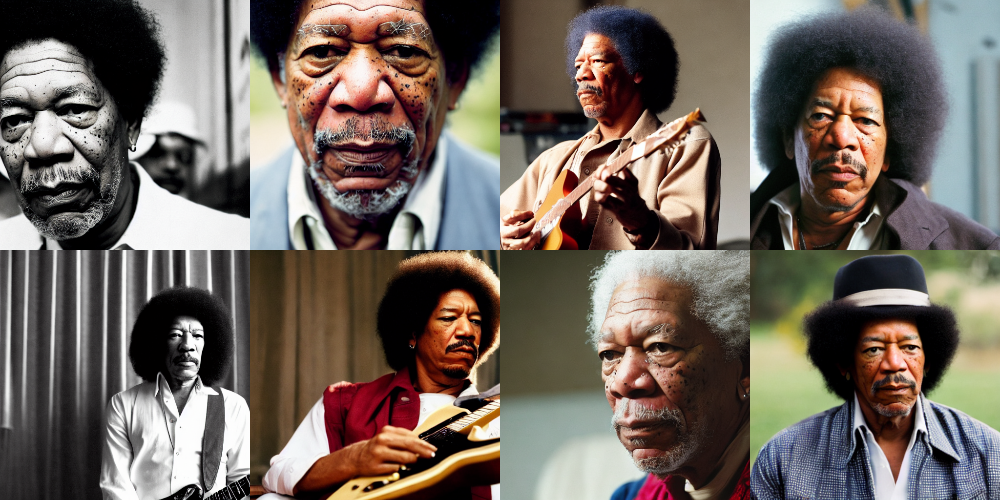

In [17]:
image_grid(images, 2, 4)

## Using different prompts

We don't have to replicate the _same_ prompt in all the devices. We can do whatever we want: generate 2 prompts 4 times each, or even generate 8 different prompts at once. Let's do that!

First, we'll refactor the input preparation code into a handy function:

In [18]:
prompts = [
    "Labrador in the style of Hokusai",
    "Painting of a squirrel skating in New York",
    "HAL-9000 in the style of Van Gogh",
    "Times Square under water, with fish and a dolphin swimming around",
    "Ancient Roman fresco showing a man working on his laptop",
    "Close-up photograph of young black woman against urban background, high quality, bokeh",
    "Armchair in the shape of an avocado",
    "Clown astronaut in space, with Earth in the background"
]

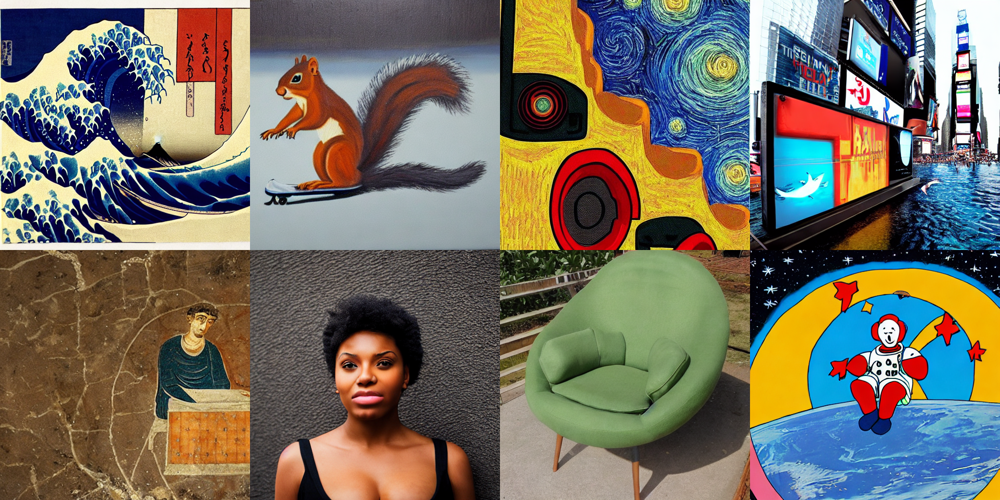

In [19]:
prompt_ids = pipeline.prepare_inputs(prompts)
prompt_ids = shard(prompt_ids)

images = pipeline(prompt_ids, p_params, rng, jit=True).images
images = images.reshape((images.shape[0] * images.shape[1], ) + images.shape[-3:])
images = pipeline.numpy_to_pil(images)

image_grid(images, 2, 4)